<a href="https://colab.research.google.com/github/write-with-neurl/modelbit-notebooks/blob/main/Deploy_CLIP_With_Modelbit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ⚡ Deploying CLIP to A Rest API Endpoint for Image Classification

## 🧑‍💻 Installations and Set Up

Let's start by installing 🤗 Transformers.

In [ ]:
!pip install --upgrade git+https://github.com/huggingface/transformers.git modelbit

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-139n00nj
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-139n00nj
  Resolved https://github.com/huggingface/transformers.git to commit 76a33a10923ccc1074917f6b6a1e719e626b7dc9
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.9/124.9 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 18.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 86.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82

## Load image

We'll perform inference on the familiar cat and dog image.

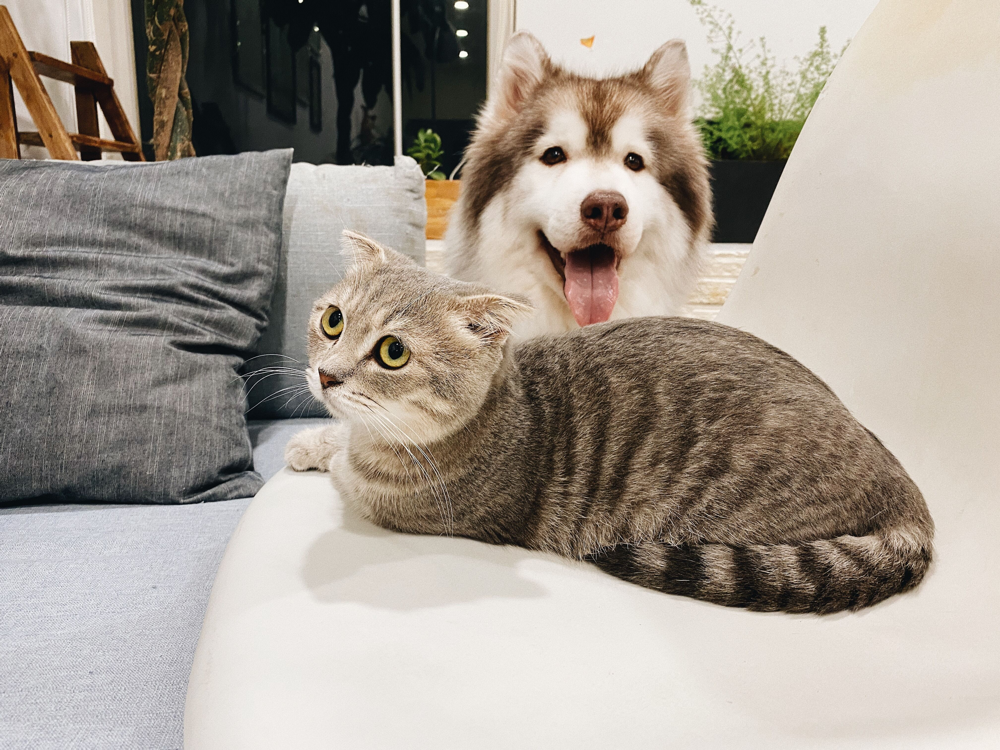

In [ ]:
from PIL import Image
import requests

url = 'http://doc.modelbit.com/img/cat.jpg'
image = Image.open(requests.get(url, stream=True).raw)
image

## Load model and processor

Next, we load the raw model CLIP checkpoint from the [hub](https://huggingface.co/openai/clip-vit-base-patch32). See the [model hub](https://huggingface.co/models?search=clip) to look for fine-tuned versions on a task that interests you.

In [ ]:
from transformers import AutoImageProcessor, CvtForImageClassification, CLIPForImageClassification

processor = AutoImageProcessor.from_pretrained("openai/clip-vit-base-patch32")
model = CLIPForImageClassification.from_pretrained("openai/clip-vit-base-patch32")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Some weights of CLIPForImageClassification were not initialized from the model checkpoint at openai/clip-vit-base-patch32 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


We'll define some texts which the model can detect. We can prepare the image and the texts for the model using the processor:

## Forward pass

Next we perform a forward pass. As we're at inference time, we use the `torch.no_grad()` operator to save memory (we don't need to compute any gradients). The model predicts one of the 1000 [ImageNet classes](https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/)

In [ ]:
import torch

inputs = processor(image, return_tensors="pt")

with torch.no_grad():
    logits = model(**inputs).logits

In [ ]:
predicted_label = logits.argmax(-1).item()
print(model.config.id2label[predicted_label])

LABEL_0


## Inference Function for Image Classification

The `get_clip_base` function, decorated with `@cache`, is our key player. This function uses `snapshot_download` to fetch the specific backbone.

The use of `@cache` is a clever optimization; it ensures that once the model and processor are loaded, they are stored in memory. This significantly speeds up future calls to this function, as it avoids reloading the model and processor from scratch each time, making it ideal for deployments.

In [ ]:
from functools import cache
from huggingface_hub import snapshot_download

@cache
def get_clip_base():
    model_path = snapshot_download(repo_id="openai/clip-vit-base-patch32")
    processor = AutoImageProcessor.from_pretrained(model_path)
    model = CLIPForImageClassification.from_pretrained(model_path)
    return model, processor

In [ ]:
def clip_inference(image_url):
    model, processor = get_clip_base()
    image = Image.open(requests.get(image_url, stream=True).raw)
    print("Image url loaded")
    inputs = processor(image, return_tensors="pt")
    with torch.no_grad():
      logits = model(**inputs).logits
    predicted_label = logits.argmax(-1).item()
    return model.config.id2label[predicted_label]

In [ ]:
clip_inference(image_url = "http://images.cocodataset.org/val2017/000000039769.jpg")

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

README.md:   0%|          | 0.00/7.94k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tf_model.h5:   0%|          | 0.00/606M [00:00<?, ?B/s]

.gitattributes:   0%|          | 0.00/690 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

flax_model.msgpack:   0%|          | 0.00/605M [00:00<?, ?B/s]

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.
Some weights of CLIPForImageClassification were not initialized from the model checkpoint at /root/.cache/huggingface/hub/models--openai--clip-vit-base-patch32/snapshots/3d74acf9a28c67741b2f4f2ea7635f0aaf6f0268 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image url loaded


'LABEL_1'

## 🚢 Deploy CLIP to a REST API Endpoint

### 🔐 Log into `modelbit`

In [ ]:
import modelbit as mb

mb.login()

<module 'modelbit' from '/usr/local/lib/python3.10/dist-packages/modelbit/__init__.py'>

In [ ]:
#Deploy the conv next v2 function to modelbit
mb.deploy(clip_inference,
          python_packages=["git+https://github.com/huggingface/transformers.git"],
          system_packages=["python3-opencv"]
          )

Uploading 'logits': 100%|██████████| 352/352 [00:00<00:00, 587B/s]


## 📩 Test the REST Endpoint with a Single Image

You can test your REST Endpoint by [sending single or batch production images](https://doc.modelbit.com/deployments/rest-api/single-inference) to it for inference.

Use the `requests` package to POST a request to the API and use `json` to format the response to print nicely:


> ⚠️ Replace the `ENTER_WORKSPACE_NAME` placeholder with your workspace name.

In [ ]:
import json
import requests

requests.post("https://ENTER_WORKSPACE_NAME.us-east-1.modelbit.com/v1/clip_inference/latest",
              headers={"Content-Type":"application/json"},
              data=json.dumps({"data": ["http://doc.modelbit.com/img/dog-in-snow.jpg"]})).json()

{'data': 'LABEL_0'}

You can also test your endpoint from the command line using:


> `curl -s -XPOST "https://ENTER_WORKSPACE_NAME.us-east-1.modelbit.com/v1/clip_inference/latest" -d '{"data": ["https://doc.modelbit.com/img/cat.jpg"]}' | json_pp`

---
> ⚠️ Replace the `ENTER_WORKSPACE_NAME` placeholder with your workspace name.